In [1]:
import my_plotting
import markers
import importlib
import utils
import covax_constants
import CovidVAX_specific_utils
import GeneModules

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy import stats
import numpy as np

import warnings
warnings.simplefilter("ignore")

from functools import partial
import scanpy as sc

import muon as mu
import anndata

In [2]:
pbmc = sc.read_h5ad('gse171964_raw_anndata.h5ad')

In [3]:
pbmc.layers['counts'] = pbmc.X.copy()

In [4]:
rna = pbmc[:, ~pbmc.var_names.str.endswith('_ADT')].copy()

rna.var_names_make_unique()

sc.pp.filter_cells(rna, min_genes=200)
sc.pp.filter_genes(rna, min_cells=3)

rna.var['mt'] = rna.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(rna, qc_vars=['mt'], percent_top=None, log1p=True, inplace=True)

sc.pp.normalize_total(rna)
sc.pp.log1p(rna)

sc.pp.highly_variable_genes(rna)

In [5]:
adt = pbmc[:, pbmc.var_names.str.endswith('_ADT')].copy()

mu.prot.pp.clr(adt)
sc.pp.normalize_total(adt)

adt.var['highly_variable'] = ~adt.var_names.str.startswith('Isotype')

In [6]:
combined = anndata.concat([rna, adt], axis = 1)

combined.obs.loc[rna.obs_names, rna.obs.columns] = rna.obs.copy()

In [7]:
combined.shape

(242065, 17703)

In [8]:
# combined.raw = combined.copy()

# combined = combined[:, combined.var.highly_variable]

combined.layers['normalized'] = combined.X.copy()

sc.pp.scale(combined, max_value=10)
sc.tl.pca(combined, svd_solver='arpack')

sc.pp.neighbors(combined, n_pcs=15)
sc.tl.umap(combined)

In [9]:
combined.obs['Visit'] = pd.Categorical(combined.obs['day'].astype(int).astype(str).map({
    '0' : 'Baseline 1',
    '1' : 'Vac1 D1',
    '2' : 'Vac1 D2',
    '7' : 'Vac1 D7',
    '21' : 'Baseline 2',
    '22' : 'Vac2 D1',
    '28' : 'Vac2 D7',
    '42' : 'Vac2 21',
}), categories=['Baseline 1', 'Vac1 D1', 'Vac1 D2', 'Vac1 D7', 'Baseline 2', 'Vac2 D1', 'Vac2 D7', 'Vac2 21'])

In [10]:
combined.obs['person'] =  combined.obs['pt_id'].map(lambda x: str(int(float(x))))

In [11]:
combined.obs['day'] =  combined.obs['day'].map(lambda x: str(int(float(x))))
combined.obs['pt_id'] =  combined.obs['pt_id'].map(lambda x: str(int(float(x))))

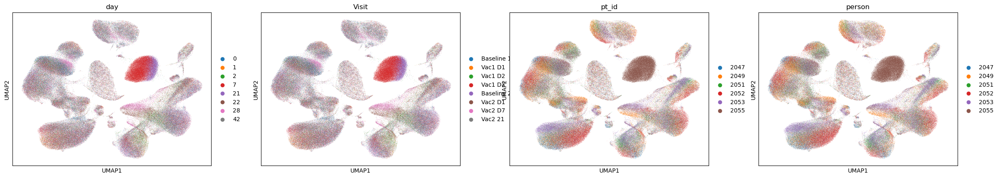

In [12]:
sc.pl.umap(combined, color = ['day', 'Visit', 'pt_id', 'person'])

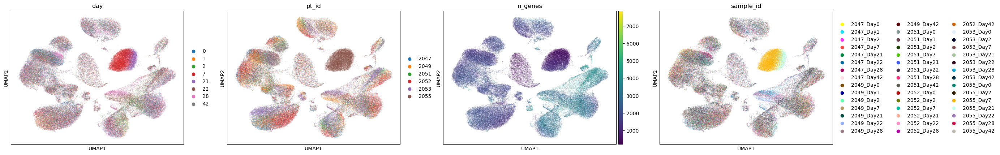

In [13]:
sc.pl.umap(combined, color = ['day', 'pt_id', 'n_genes', 'sample_id'])

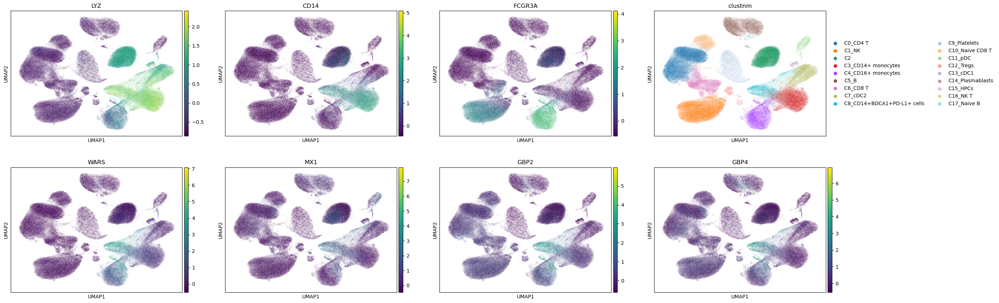

In [14]:
sc.pl.umap(combined, color = ['LYZ', 'CD14', 'FCGR3A', 'clustnm', 'WARS', 'MX1', 'GBP2', 'GBP4'])

categories: C0_CD4 T, C1_NK, C2, etc.
var_group_labels: T Cell, Mono, Myeloid, etc.


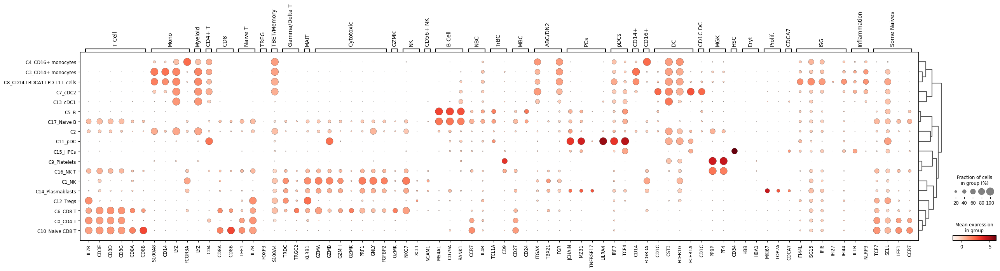

In [15]:
sc.tl.dendrogram(combined, groupby='clustnm')
sc.pl.dotplot(combined, var_names = markers.global_markers, groupby='clustnm', dendrogram=True)

In [13]:
# combined.write_h5ad('pbmc-1.h5ad')

# Myeloid

In [16]:
myeloid = combined[combined.obs['clustnm'].isin({
    'C3_CD14+ monocytes', 
    'C4_CD16+ monocytes',
    'C7_cDC2', 
    'C8_CD14+BDCA1+PD-L1+ cells',
    'C13_cDC1',
})].copy()

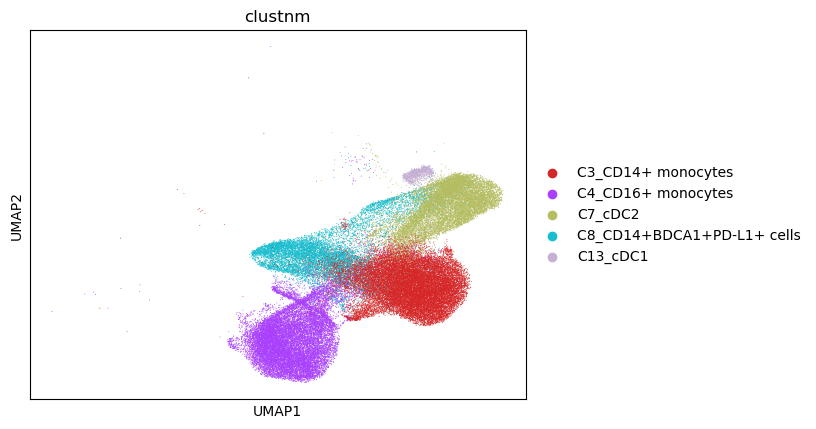

In [17]:
sc.pl.umap(myeloid, color = 'clustnm')

In [18]:
# myeloid = myeloid.raw.to_adata()

# myeloid.raw = myeloid.copy()

myeloid.X = myeloid.layers['normalized'].copy()

In [19]:
hvg = sc.pp.highly_variable_genes(myeloid[:, ~myeloid.var_names.str.endswith('_ADT')], inplace=False)

In [20]:
myeloid.var.loc[~myeloid.var_names.str.endswith('_ADT'), 'highly_variable'] = hvg['highly_variable'].values

In [21]:
sc.pp.scale(myeloid, max_value=10)

sc.tl.pca(myeloid, svd_solver='arpack', use_highly_variable=True)

In [22]:
sc.external.pp.bbknn(myeloid, batch_key='person')

sc.tl.umap(myeloid)

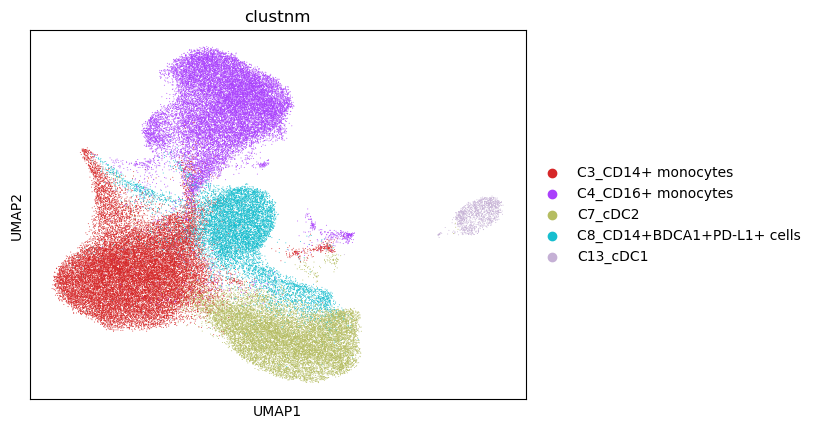

In [23]:
sc.pl.umap(myeloid, color = 'person')

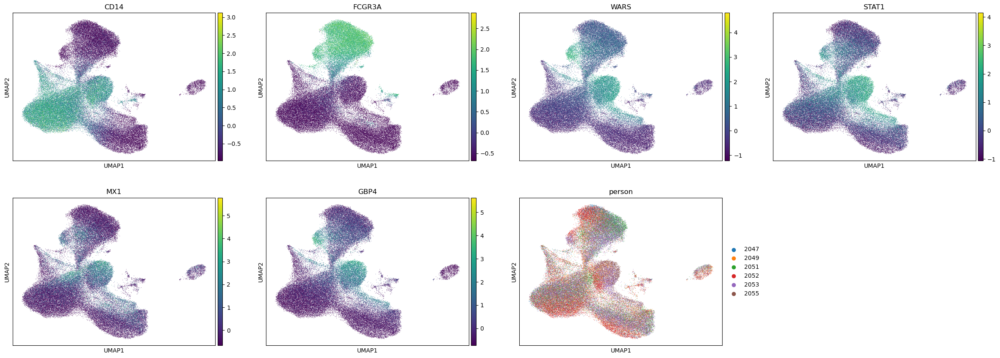

In [24]:
sc.pl.umap(myeloid, color = ['CD14', 'FCGR3A', 'WARS', 'STAT1', 'MX1', 'GBP4', 'person'])

In [25]:
sc.tl.leiden(myeloid, resolution=0.5, key_added='l050')

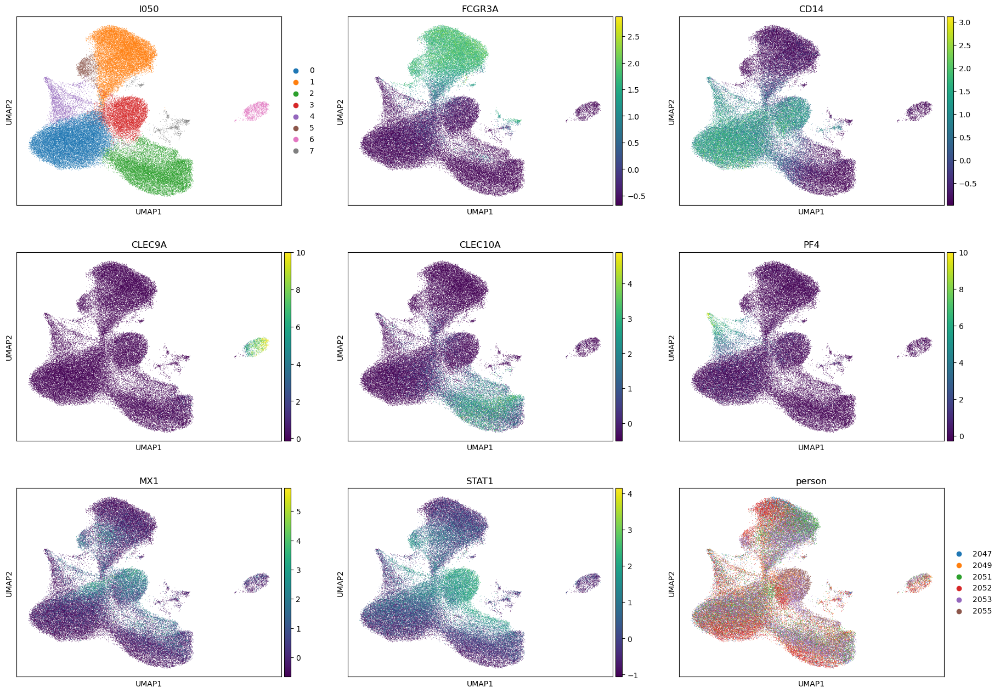

In [26]:
sc.pl.umap(myeloid, color = ['l050', 'FCGR3A', 'CD14', 'CLEC9A', 'CLEC10A', 'PF4', 'MX1', 'STAT1', 'person'], ncols = 3)

# CD14

In [28]:
cd14 = myeloid[myeloid.obs.l050.isin({'0', '3'}) & (~myeloid.obs.clustnm.isin({'C4_CD16+ monocytes'}))].copy()

In [29]:
cd14.X = cd14.layers['normalized'].copy()

hvg = sc.pp.highly_variable_genes(cd14[:, ~cd14.var_names.str.endswith('_ADT')], inplace=False)

# cd14.var['highly_variable'] = False
# cd14.var.loc[~cd14.var_names.str.endswith('_ADT'), 'highly_variable'] = hvg['highly_variable'].values
cd14.var.loc[~cd14.var_names.str.endswith('_ADT'), 'highly_variable'] = hvg['highly_variable'].values

sc.pp.scale(cd14, max_value=10)

sc.tl.pca(cd14, svd_solver='arpack', use_highly_variable=True)

sc.external.pp.bbknn(cd14, batch_key='person')

sc.tl.umap(cd14)

In [30]:
sc.tl.leiden(cd14, resolution=0.3, key_added='l030')

sc.tl.leiden(cd14, resolution=0.2, key_added='l030_1', restrict_to=('l030', ['1']))

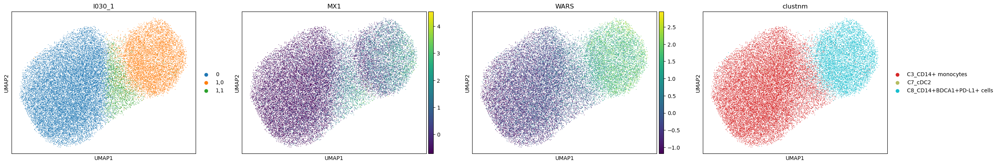

In [31]:
sc.pl.umap(cd14, color = ['l030_1', 'MX1', 'WARS', 'clustnm'])
# sc.pl.umap(cd14, color = ['CD14', 'FCGR3A', 'WARS', 'MX1'])

In [32]:
cd14.obs['subsets'] = pd.Categorical(cd14.obs['l030_1'].map({
    '0' : 'ISG Low',
    '1,0' : 'ISG High',
    '1,1' : 'ISG Dim',
}), categories=reversed(['ISG Low', 'ISG Dim', 'ISG High']))

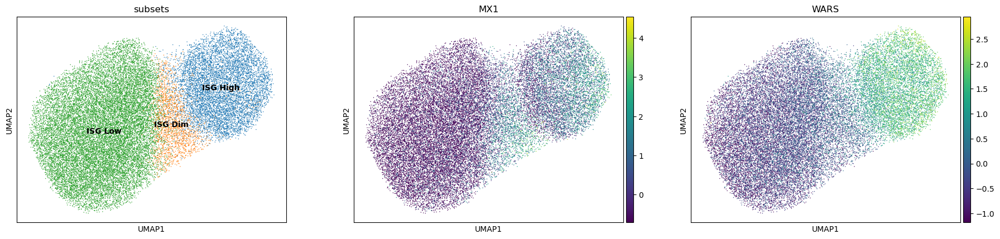

In [33]:
sc.pl.umap(cd14, color = ['subsets', 'MX1', 'WARS'], legend_loc='on data')
# sc.pl.umap(cd14, color = ['CD14', 'FCGR3A', 'WARS', 'MX1'])

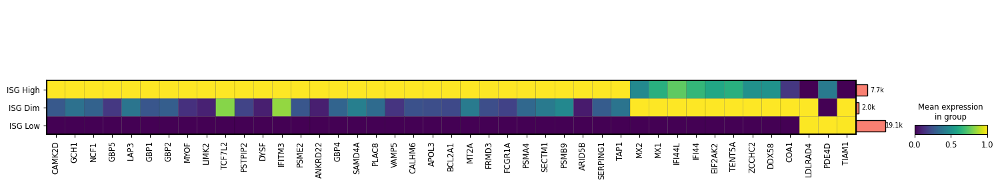

In [34]:
mp = sc.pl.matrixplot(cd14,
              GeneModules.InterferonModules.Manual.CD14_heatmap_24_09_12, 
              groupby = 'subsets', 
              standard_scale = 'var',
              return_fig=True
             )

mp.add_totals().style(edge_color='black').show()
fig = mp.fig
# my_plotting.savefig_png_eps(fig, 'cd14_subsets_isg_matrixplot', make_folder=True)

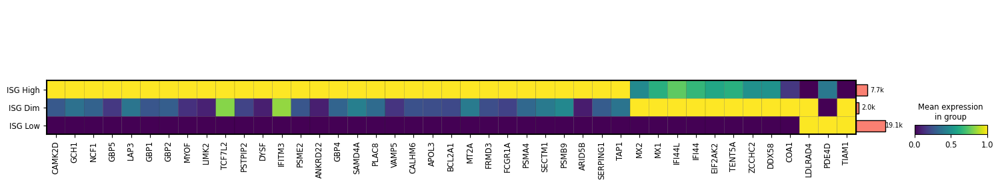

In [31]:
mp = sc.pl.matrixplot(cd14,
              GeneModules.InterferonModules.Manual.CD14_heatmap_24_09_12, 
              groupby = 'subsets', 
              standard_scale = 'var',
              return_fig=True
             )

mp.add_totals().style(edge_color='black').show()
fig = mp.fig
# my_plotting.savefig_png_eps(fig, 'cd14_subsets_isg_matrixplot', make_folder=True)

In [36]:
cd14.write_h5ad('CD14-1_1.h5ad')

In [37]:
cd14 = sc.read_h5ad('CD14-1_1.h5ad')

In [40]:
cd14.var.highly_variable.sum()

1457

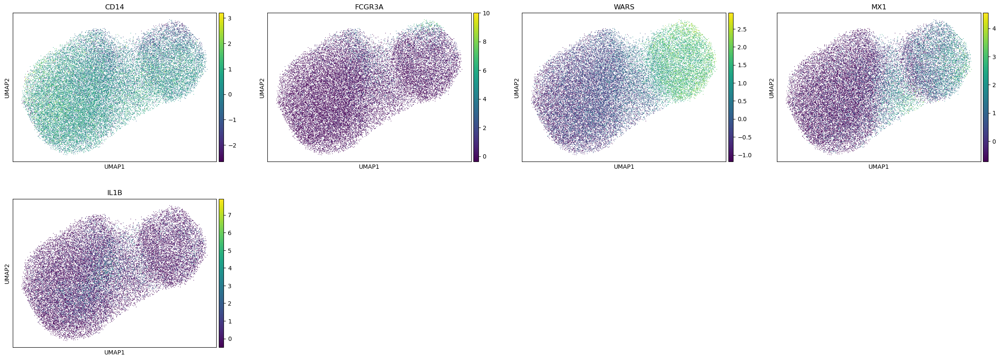

In [42]:
sc.pl.umap(cd14, color = ['CD14', 'FCGR3A', 'WARS', 'MX1', 'IL1B'])